# Сборный проект-5

Необходимо разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

**Описание данных**

Данные доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).
Данные представлены в следующих файлах: для обучения модели `train_dataset.csv` и `train_images`, по соответствию изображения и описания `CrowdAnnotations.tsv` и `ExpertAnnotations.tsv`, для тестирования модели `test_queries.csv` и `test_images`.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

**Составим краткий план исследования:**
1. Загрузка данных
2. Исследовательский анализ данных
3. Подготовка данных к обучению модели
    - очистка датасета
    - векторизация текстового описания
    - векторизация изображений
4. Обучение модели
    - выбор метрики
    - подбор гиперпараметров
5. Тестирование модели и демонстрация её работы
6. Общий вывод

In [1]:
# !pip install torchvision -q

In [2]:
# импорт необходимых библиотек
import pandas as pd
import numpy as np
import re
import os

import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from PIL import Image

import spacy
import nltk
from nltk.corpus import stopwords as nltk_stopwords

import torch
import torch.nn as nn
import transformers
import torchvision.models as models
from torchvision import transforms
from tqdm import tqdm

from sklearn.model_selection import GroupShuffleSplit, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import make_scorer, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from lightgbm import LGBMRegressor

c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# производительность
gpu = torch.device("cuda:0" if torch.cuda.is_available() else "cpu");

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


### 1.1 Загрузка данных

In [4]:
# чтение файлов с данными
try:
    path = './to_upload/'
    train_df = pd.read_csv(path + 'train_dataset.csv', sep=',')
    crowd = pd.read_csv(path + 'CrowdAnnotations.tsv', sep='\t',
                        names=['image', 'query_id', 'proportion_pos', 'count_pos', 'count_neg'])
    expert = pd.read_csv(path + 'ExpertAnnotations.tsv', sep='\t',
                         names=['image', 'query_id', 'expert_1', 'expert_2', 'expert_3'])
    test_queries = pd.read_csv(path + 'test_queries.csv', sep='|', index_col='Unnamed: 0')
    test_images = pd.read_csv(path + 'test_images.csv', sep='|')
except:
    path = '../to_upload/'
    train_df = pd.read_csv(path + 'train_dataset.csv', sep=',')
    crowd = pd.read_csv(path + 'CrowdAnnotations.tsv', sep='\t',
                        names=['image', 'query_id', 'proportion_pos', 'count_pos', 'count_neg'])
    expert = pd.read_csv(path + 'ExpertAnnotations.tsv', sep='\t',
                         names=['image', 'query_id', 'expert_1', 'expert_2', 'expert_3'])
    test_queries = pd.read_csv(path + 'test_queries.csv', sep='|', index_col='Unnamed: 0')
    test_images = pd.read_csv(path + 'test_images.csv', sep='|')

In [5]:
def funk_info(df):
    '''Функция для вывода первичной информации'''
    display(df.head())
    df.info()
    print('Наименования столбцов:', df.columns)
    print(f'Количество пропусков:\n{df.isna().sum()}')
    print('Количество явных дубликатов:', df.duplicated().sum())

**Данных для обучения**

В файле `train_dataset.csv` находится информация, необходимая для обучения: 
- image - имя файла изображения, 
- query_id - идентификатор описания,
- query_text - текст описания. 

Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`. В папке `train_images` содержатся изображения для тренировки модели.

In [6]:
# вывод информации о данных для обучения
funk_info(train_df)

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
Наименования столбцов: Index(['image', 'query_id', 'query_text'], dtype='object')
Количество пропусков:
image         0
query_id      0
query_text    0
dtype: int64
Количество явных дубликатов: 0


**Данных по соответствию изображения и описания, полученные с помощью краудсорсинга**

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:
- image - имя файла изображения;
- query_id - идентификатор описания;
- proportion_pos - доля людей, подтвердивших, что описание соответствует изображению;
- count_pos - количество человек, подтвердивших, что описание соответствует изображению;
- count_neg - количество человек, подтвердивших, что описание не соответствует изображению.

In [7]:
# вывод информации о данных по соответствию изображений описаниям
funk_info(crowd)

,image,query_id,proportion_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           47830 non-null  object 
 1   query_id        47830 non-null  object 
 2   proportion_pos  47830 non-null  float64
 3   count_pos       47830 non-null  int64  
 4   count_neg       47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB
Наименования столбцов: Index(['image', 'query_id', 'proportion_pos', 'count_pos', 'count_neg'], dtype='object')
Количество пропусков:
image             0
query_id          0
proportion_pos    0
count_pos         0
count_neg         0
dtype: int64
Количество явных дубликатов: 0


**Данных по соответствию изображения и описания, полученные в результате опроса экспертов**

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:
- image - имя файла изображения;
- query_id - идентификатор описания;
- expert_1 - оценка первого эксперта;
- expert_2 - оценка второго эксперта;
- expert_3 - оценка третьего эксперта.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

In [8]:
# вывод информации о данных по соответствию изображений описаниям, полученных от экспертов
funk_info(expert) 

,image,query_id,expert_1,expert_2,expert_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert_1  5822 non-null   int64 
 3   expert_2  5822 non-null   int64 
 4   expert_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB
Наименования столбцов: Index(['image', 'query_id', 'expert_1', 'expert_2', 'expert_3'], dtype='object')
Количество пропусков:
image       0
query_id    0
expert_1    0
expert_2    0
expert_3    0
dtype: int64
Количество явных дубликатов: 0


**Данных для тестирования**

В файле `test_queries.csv` находится информация, необходимая для тестирования: 
- query_id - идентификатор запроса,
- query_text - текст запроса,
- image - релевантное изображение. 

Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`. В папке `test_images` содержатся изображения для тестирования модели.

In [9]:
# вывод информации данных для тестирования
funk_info(test_queries) 

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB
Наименования столбцов: Index(['query_id', 'query_text', 'image'], dtype='object')
Количество пропусков:
query_id      0
query_text    0
image         0
dtype: int64
Количество явных дубликатов: 0


In [10]:
# вывод информации по изображениям для тестирования
funk_info(test_images) 

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes
Наименования столбцов: Index(['image'], dtype='object')
Количество пропусков:
image    0
dtype: int64
Количество явных дубликатов: 0


**Выводы:** Данные всех представленных данных загружены и прочитаны. Пропуски и явные дубликаты в данных отсутствуют.

### 1.2 Исследовательский анализ данных

In [11]:
def clear_text(text):
    '''Функция очистки текста'''
    text_r = text.lower().split()
    text_r = ' '.join(text_r)
    text_r = re.sub(r'[^a-z ]', '', text_r)
    return text_r

def word_cloud(df):
    '''Функция построения облака слов'''
    plt.figure(figsize=(16,16))
    text = ' '.join(df.values)
    WC = WordCloud(width=1000, height=500, max_words=500, min_font_size=5, collocations=False)
    cloud_1 = WC.generate(text)
    plt.imshow(cloud_1, interpolation='bilinear')
    plt.title(f'Облако слов', fontsize=20)
    plt.show

def image_show(path_df, df):
    '''Функция вывода фотографий'''
    fig = plt.figure(figsize=(10,10))
    for i in range(12):
        fig.add_subplot(4, 4, i+1)
        image = Image.open(path+path_df+df['image'][i])
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()
    del image

#### Исследовательский анализ данных для обучения модели

Исследуем файлы для обучения модели. Так как данные представлены набором "текст-картинка", то построим облако слов, чтобы понять какие слова упоминаются наиболее часто. А также выведем несколько картинок.

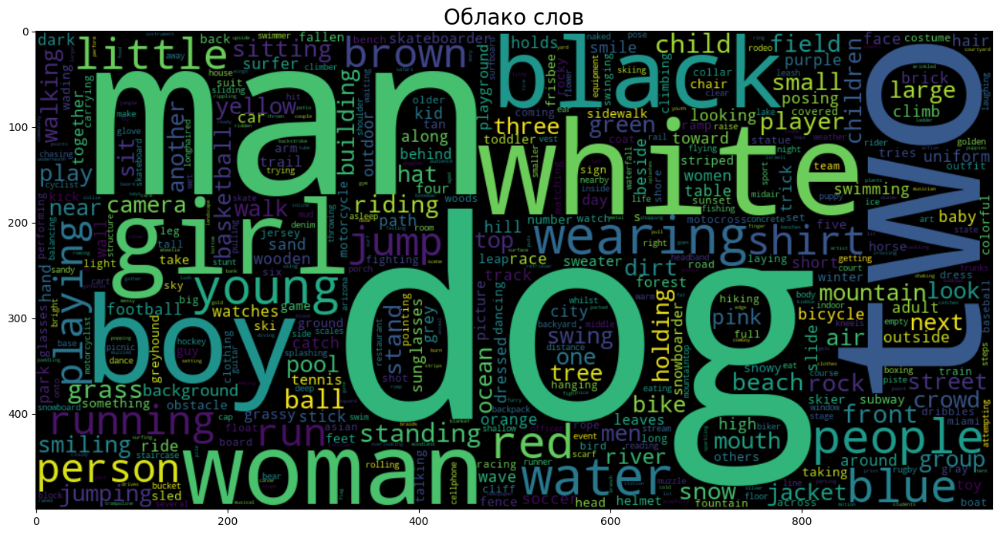

In [12]:
# очистим текст описаний
train_df['clean_query_text'] = [clear_text(x) for x in train_df['query_text']]
# построим облако слов
word_cloud(train_df['clean_query_text'])

In [13]:
print('Количество уникальных изображений в данных для обучения:', len(train_df['image'].unique()))
print('Количество уникальных описаний в данных для обучения:', len(train_df['clean_query_text'].unique()))

Количество уникальных изображений в данных для обучения: 1000
Количество уникальных описаний в данных для обучения: 977


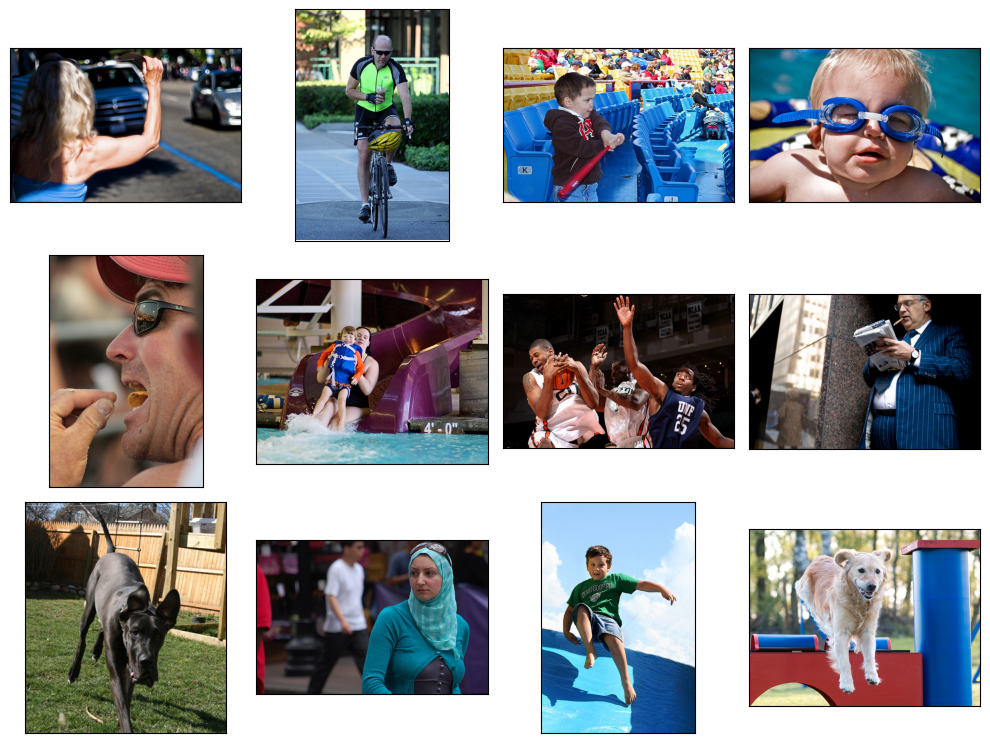

In [14]:
# выведем несколько фотографий
image_show('/train_images/', train_df)

**Вывод:** Наиболее часто встречаются слова *dog*, *two* и *man*. В данных имеется с 977 уникальных описаний и 1000 изображений. Следует отметить, что в описаниях встречаются слова *boy*, *girl* и *young*, а в фотографиях встречаются фото детей, что может накладывать законодательные ограничения в использовании таких данных в ряде стран.

#### Исследовательский анализ данных для тестирования модели

Исследуем файлы для тестирования модели. Так как данные представлены набором "текст-картинка", то построим облако слов, чтобы понять какие слова упоминаются наиболее часто. А также выведем несколько картинок.

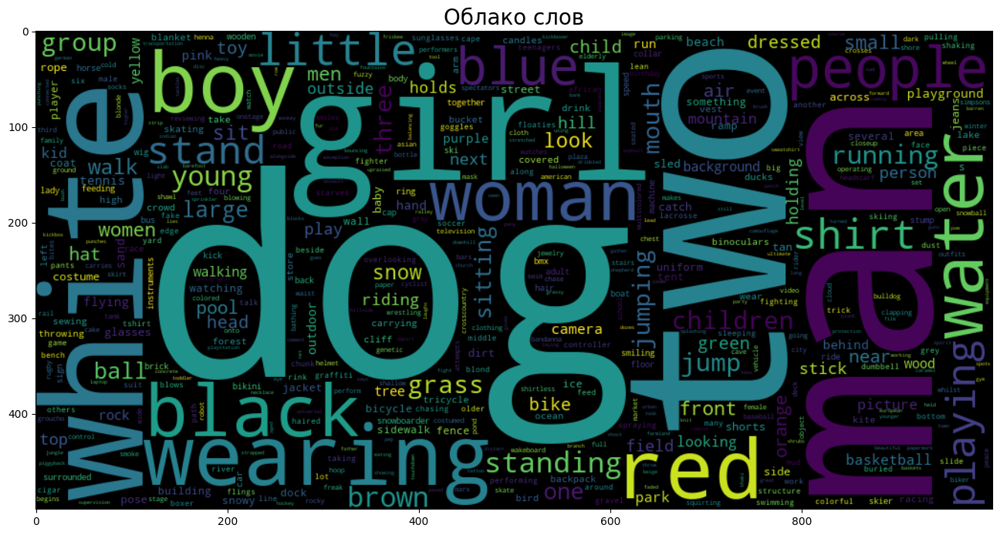

In [15]:
# очистим текст описаний
test_queries['clean_query_text'] = [clear_text(x) for x in test_queries['query_text']]
# построим облако слов
word_cloud(test_queries['clean_query_text'])

In [16]:
print('Количество уникальных изображений в данных для обучения:', len(test_images['image'].unique()))
print('Количество уникальных описаний в данных для обучения:', len(test_queries['clean_query_text'].unique()))

Количество уникальных изображений в данных для обучения: 100
Количество уникальных описаний в данных для обучения: 500


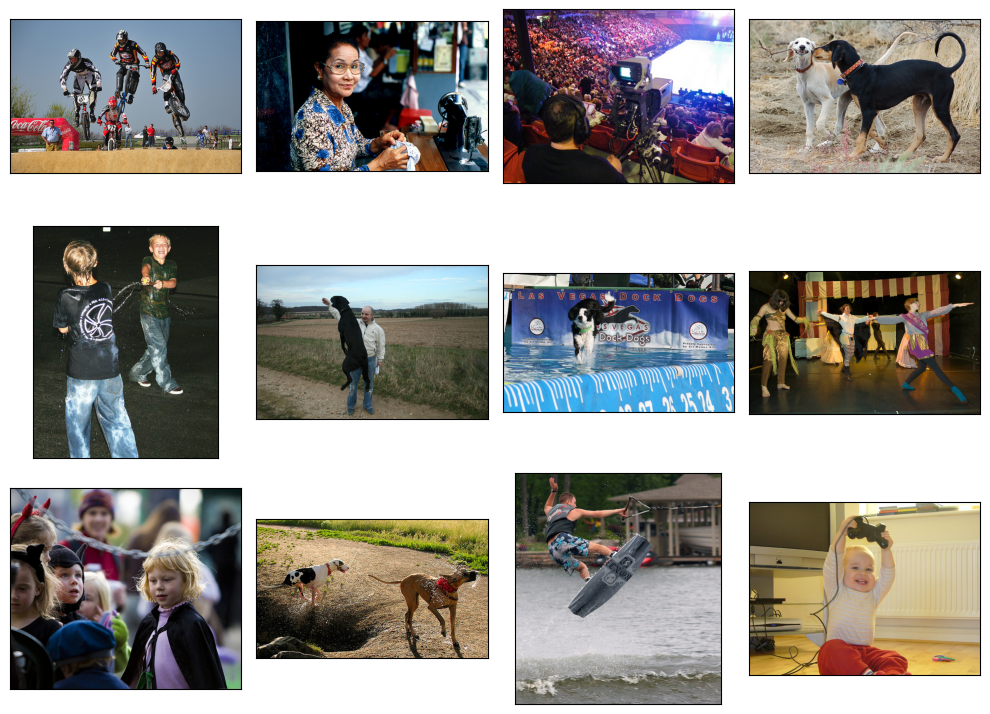

In [17]:
# выведем несколько фотографий
image_show('/test_images/', test_images)

**Вывод:** Наиболее часто встречаются слова *dog*, *man* и *two*. В данных имеется с 500 уникальных описаний и 100 изображений. Следует отметить, что в описаниях встречаются слова *boy*, *girl* и *young*, а в фотографиях встречаются фото детей, что может накладывать законодательные ограничения в использовании таких данных в ряде стран.

#### Исследовательский анализ данных соответствия изображений описаниям по краудсорсинговым оценкам 

В файле с краудсорсинговыми оценками информация расположена в следующем порядке:
1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

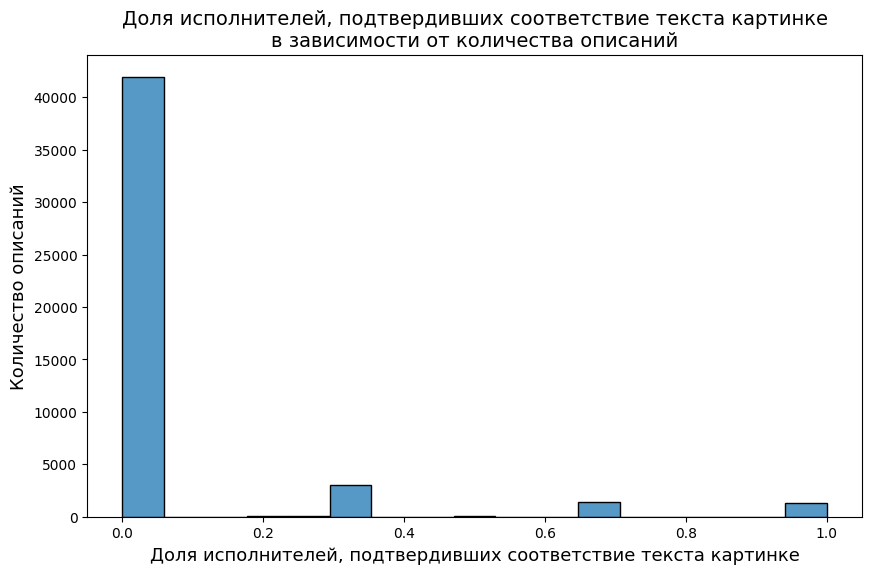

In [18]:
# график зависимости доли исполнителей, подтвердивших соответствие текста картинке, от количества данных
plt.subplots(figsize=(10, 6))
sns.histplot(crowd['proportion_pos'])
plt.title(f'Доля исполнителей, подтвердивших соответствие текста картинке\nв зависимости от количества описаний', fontsize=14)
plt.xlabel('Доля исполнителей, подтвердивших соответствие текста картинке', fontsize=13)
plt.ylabel('Количество описаний', fontsize=13)
plt.show()

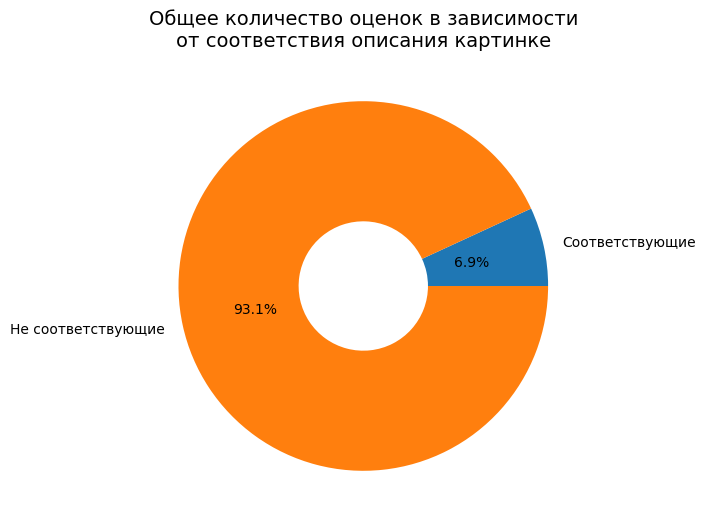

In [19]:
crowd_df = np.array([['Соответствующие', crowd['count_pos'].sum()],
                ['Не соответствующие', crowd['count_neg'].sum()]])
crowd_df = pd.DataFrame(crowd_df, columns=['Описания', 'Количество оценок'])
# график количества оценок
plt.subplots(figsize=(10, 6))
plt.pie(crowd_df['Количество оценок'], labels=list(crowd_df['Описания'].unique()),
                wedgeprops=dict(width=0.65), autopct='%1.1f%%')
plt.title(f'Общее количество оценок в зависимости\nот соответствия описания картинке', fontsize=14)
plt.show()

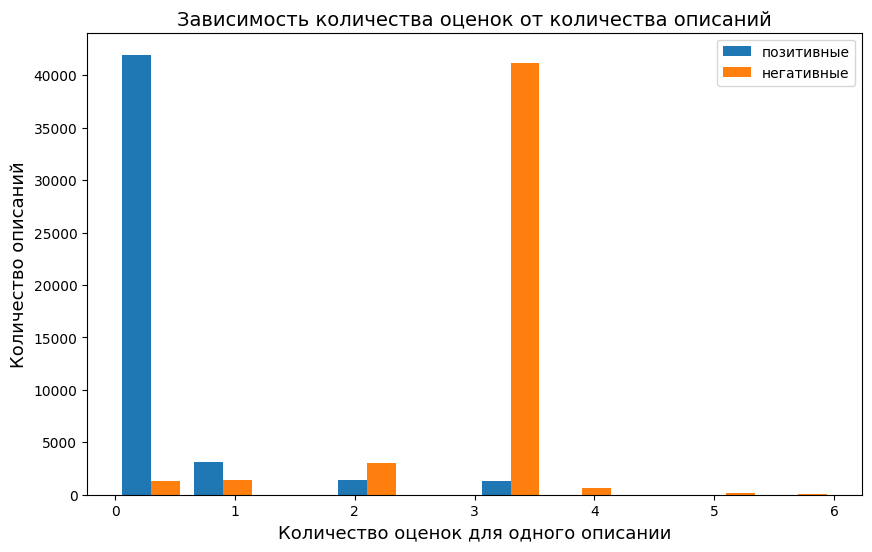

In [20]:
# график зависимости доли исполнителей, подтвердивших соответствие текста картинке, от количества данных
plt.subplots(figsize=(10, 6))
plt.hist([crowd['count_pos'], crowd['count_neg']])
plt.title(f'Зависимость количества оценок от количества описаний', fontsize=14)
plt.xlabel('Количество оценок для одного описании', fontsize=13)
plt.ylabel('Количество описаний', fontsize=13)
plt.legend(['позитивные', 'негативные'])
plt.show()

In [21]:
print('Количество уникальных изображений в данных c краудсорсинговым оценкам:', len(crowd['image'].unique()))
print('Количество уникальных описаний в данных c краудсорсинговым оценкам:', len(crowd['query_id'].unique()))

Количество уникальных изображений в данных c краудсорсинговым оценкам: 1000
Количество уникальных описаний в данных c краудсорсинговым оценкам: 1000


In [22]:
crowd.describe().T

,count,mean,std,min,25%,50%,75%,max
proportion_pos,47830.0,0.068786,0.207532,0.0,0.0,0.0,0.0,1.0
count_pos,47830.0,0.208488,0.628898,0.0,0.0,0.0,0.0,5.0
count_neg,47830.0,2.820155,0.656676,0.0,3.0,3.0,3.0,6.0


**Вывод:** Количество уникальных изображений и описаний, которые были оценены с помощью краудсорсинга, составляют по 1000 экземпляров. Из графиков можно увидеть, что количество негативных оценок, когда исполнители, подтвердили, что текст не соответствует картинке, значительно больше положительных оценок - 93% против 7%. Больше всего описаний не получают ни одной положительной оценки, а негативных - от трех исполнителей.

#### Исследовательский анализ данных соответствия изображений описаниям по экспертным оценкам 

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Эксперты ставят оценки по шкале от 1 до 4, где:
* 1 — изображение и запрос совершенно не соответствуют друг другу, 
* 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 
* 3 — запрос и текст соответствуют с точностью до некоторых деталей, 
* 4 — запрос и текст соответствуют полностью.

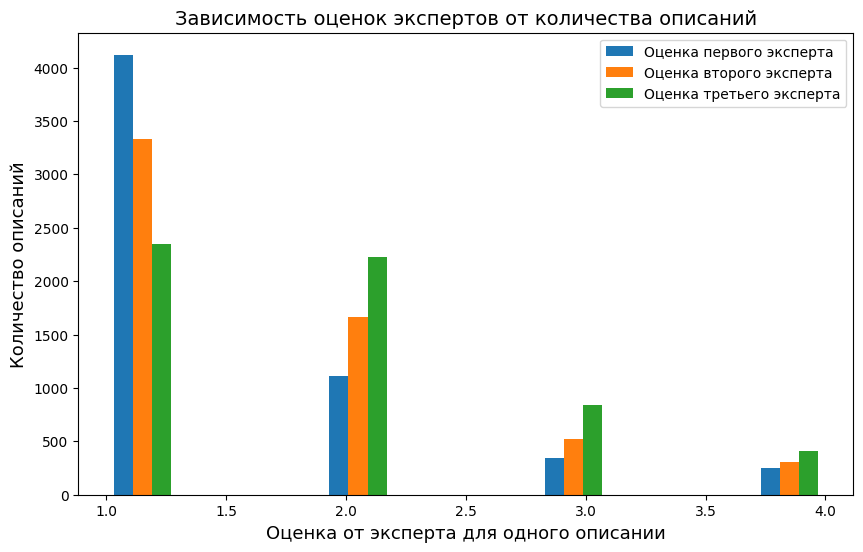

In [23]:
# график зависимости доли исполнителей, подтвердивших соответствие текста картинке, от количества данных
plt.subplots(figsize=(10, 6))
plt.hist([expert['expert_1'], expert['expert_2'], expert['expert_3']])
plt.title(f'Зависимость оценок экспертов от количества описаний', fontsize=14)
plt.xlabel('Оценка от эксперта для одного описании', fontsize=13)
plt.ylabel('Количество описаний', fontsize=13)
plt.legend(['Оценка первого эксперта', 'Оценка второго эксперта', 'Оценка третьего эксперта'])
plt.show()

In [24]:
print('Количество уникальных изображений в данных c экспертными оценкам:', len(expert['image'].unique()))
print('Количество уникальных описаний в данных c экспертными оценкам:', len(expert['query_id'].unique()))

Количество уникальных изображений в данных c экспертными оценкам: 1000
Количество уникальных описаний в данных c экспертными оценкам: 977


In [25]:
expert.describe().T

,count,mean,std,min,25%,50%,75%,max
expert_1,5822.0,1.436620,0.787084,1.0,1.0,1.0,2.0,4.0
expert_2,5822.0,1.624356,0.856222,1.0,1.0,1.0,2.0,4.0
expert_3,5822.0,1.881999,0.904087,1.0,1.0,2.0,2.0,4.0


**Вывод:** Количество уникальных изображений и описаний, которые были оценены экспертами, составляют 1000 экземпляров изображений и 977 текстов. Из графиков можно увидеть, что количество негативных оценок, когда эксперты, подтвердили, что текст совершенно не соответствует картинке, значительно больше чем когда текст и изображение немного соответствуют.

### 1.3 Агрегация краудсорсинговых и экспертных оценок 

Краудсорсинговые и экспертные оценки необходимо превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.

In [26]:
def expert_agr(row):
    'Функция агрегации экспертных оценок'
    if row['expert_1'] != row['expert_2'] != row['expert_3']:
        row['expert_un'] = None
    else:
        row['expert_un'] = max([row['expert_1'], row['expert_2'], row['expert_3']], key=[row['expert_1'], row['expert_2'], row['expert_3']].count)
    return row

def agr(row):
    'Функция агрегации оценок'
    if pd.isna(row['proportion_pos']):
        row['agr'] = row['expert_norm']
    elif pd.isna(row['expert_norm']):
        row['agr'] = row['proportion_pos']
    else:
        row['agr'] = 0.6 * row['expert_norm'] + 0.4 * row['proportion_pos']
    return row

In [27]:
# агрегация экспертных оценок
expert = expert.apply(expert_agr, axis=1)
display(expert.head())
print('Процент несовпадающих оценок у экспертов:', round(float(expert['expert_un'].isna().sum() / expert.shape[0] * 100), 2), '%')

,image,query_id,expert_1,expert_2,expert_3,expert_un
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,1.0
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,2.0
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,1.0


Процент несовпадающих оценок у экспертов: 2.16 %


In [28]:
# нормализация экспертных оценок
min_un = expert['expert_un'].min()
max_un = expert['expert_un'].max()
expert['expert_norm'] = (expert['expert_un'] - min_un) / (max_un - min_un) 
expert.value_counts('expert_norm')

expert_norm
0.000000    3327
0.333333    1566
0.666667     492
1.000000     311
Name: count, dtype: int64

In [29]:
# объединение экспертных и краудсорсинговых оценок
# выберем объединение left, так как он совпадает по размеру с данными для обучения
df_ass = expert.merge(crowd, on=['image', 'query_id'], how='left')
df_ass = df_ass.drop(['expert_1', 'expert_2', 'expert_3', 'expert_un', 'count_pos', 'count_neg'], axis=1)

In [30]:
# агрегация оценок
df_ass = df_ass.apply(agr, axis=1)
display(df_ass.head())
print('Процент пропусков:\n', round(df_ass.isna().sum() / df_ass.shape[0] * 100), 2)

,image,query_id,expert_norm,proportion_pos,agr
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000000,0.0,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000000,0.0,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000000,NaN,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.333333,NaN,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000000,NaN,0.000000


Процент пропусков:
 image              0.0
query_id           0.0
expert_norm        2.0
proportion_pos    60.0
agr                1.0
dtype: float64 2


In [31]:
# оставим только столбец с агрегированными оценками
df_ass = df_ass.drop(['expert_norm', 'proportion_pos'], axis=1)
# удалим отсутвующие значения
df_ass = df_ass.dropna()
df_ass.shape

(5767, 3)

**Вывод:** На основе краудсорсинговых и экспертных оценок была получена агрегированая оценка соответствия изображения тексту. Для этого экспертные оценки на основе "голосование большинства" были объединены в одну оценку и далее нормализованны.
Далее был объединены датасеты с краудсорсинговой и экспертной оценками, которые были объединены в одну с коэффициентами 0.4 и 0.6 соответственно. Если какая из оценок отсутствовала, то принималась в качестве итоговой та, которая не отсутсвовала. Данные в которых обе оценки, и краудсорсинговая и экспертная, отсутсвовали, были удалены.

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

In [32]:
# объединим данные для обучения и агрегированную оценку
train_df = train_df.merge(df_ass, on=['image', 'query_id'], how='right')
train_df.head()

,image,query_id,query_text,clean_query_text,agr
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,a young child is wearing blue goggles and sitt...,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,a girl wearing a yellow shirt and sunglasses s...,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,a man sleeps under a blanket on a city street,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,a woman plays with long red ribbons in an empt...,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,chinese market street in the winter time,0.000000


In [33]:
# Загрузка языковой модели
nlp = spacy.load('en_core_web_sm')

def lemmatize(text):
    '''Функция лемматизации'''
    lem_doc = nlp(text)
    lem_text = [token.lemma_ for token in lem_doc]
    return ' '.join(lem_text)

In [34]:
# загрузка WordNet для лемматизации
nltk.download('wordnet')
# загрузка и сохранение стоп-слов
stopwords = list(set(nltk_stopwords.words('english')))

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Ambrosovskaya_T\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [35]:
# лемматизация
if os.path.exists('lemmatize.csv'):
    # чтение из файла
    df_l = pd.read_csv('./lemmatize.csv', sep=',', index_col='Unnamed: 0')    
    train_df['lemm_text'] = [str(i) for i in df_l['lemm']]
else:
    train_df['lemm_text'] = train_df['clean_query_text'].apply(lemmatize)
    # запись в файл
    data_lemm = pd.DataFrame()
    data_lemm['lemm'] = train_df['lemm_text']
    data_lemm.to_csv('lemmatize.csv', index=True)

In [36]:
# проверка, что лемматизированный текст добавлен в датафрейм
train_df.head()

,image,query_id,query_text,clean_query_text,agr,lemm_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,a young child is wearing blue goggles and sitt...,0.000000,a young child be wear blue goggle and sit in a...
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,a girl wearing a yellow shirt and sunglasses s...,0.000000,a girl wear a yellow shirt and sunglasse smile
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,a man sleeps under a blanket on a city street,0.000000,a man sleep under a blanket on a city street
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,a woman plays with long red ribbons in an empt...,0.333333,a woman play with long red ribbon in an empty ...
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,chinese market street in the winter time,0.000000,chinese market street in the winter time


In [37]:
# создадим список слов, которые могут попадать по запрет изображений и текстов
BLOCK_WORDS = ['child', 'children', 'kid', 'kids', 'toddler', 'infant',
               'baby', 'girl', 'girls', 'boy', 'boys', 'teenager', 'teenagers',
               'teen', 'youth', 'youngster', 'underage', 'schoolchild']

In [38]:
def block(text):
    '''Функция разметки текста'''
    text_list = text.split()
    intersection = set(text_list).intersection(BLOCK_WORDS)
    if intersection:
        return 1
    else:
        return 0

In [39]:
# оставим только необходимые столбцы
train_df = train_df.drop(['query_text', 'clean_query_text'], axis=1)
# маркируем тексты
train_df['block_text'] = [block(x) for x in train_df['lemm_text']]
train_df.head()

,image,query_id,agr,lemm_text,block_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000000,a young child be wear blue goggle and sit in a...,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000000,a girl wear a yellow shirt and sunglasse smile,1
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000000,a man sleep under a blanket on a city street,0
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.333333,a woman play with long red ribbon in an empty ...,0
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000000,chinese market street in the winter time,0


In [40]:
# считаем уникальные заблокированные тексты
block_texts = train_df.drop_duplicates(subset=['lemm_text'])
# выводим количество уникальных изображений
print('Всего уникальных изображений попадающих под ограничения:', block_texts['block_text'].sum())

Всего уникальных изображений попадающих под ограничения: 292


In [41]:
# выводим несколько заблокированных текстов
print(block_texts[block_texts['block_text'] == 1]['lemm_text'].sample(10).unique())

['two woman with a baby carriage in a building next to a table and chair'
 'boy and girl make a sand castle'
 'a young boy   play basketball   be get ready to take a shot'
 'two girl in soccer strip be play on a sport field'
 'a man balance on his forearm while a child watch in front of a colorful background'
 'a boy with a bottle play with an old girl'
 'two little child and one be play with a slinky' 'kid swinge on a swing'
 'a little kid in blue shoe be push a toy baby in a stroller'
 'a small child climb a large rock while someone cast a shadow take her picture']


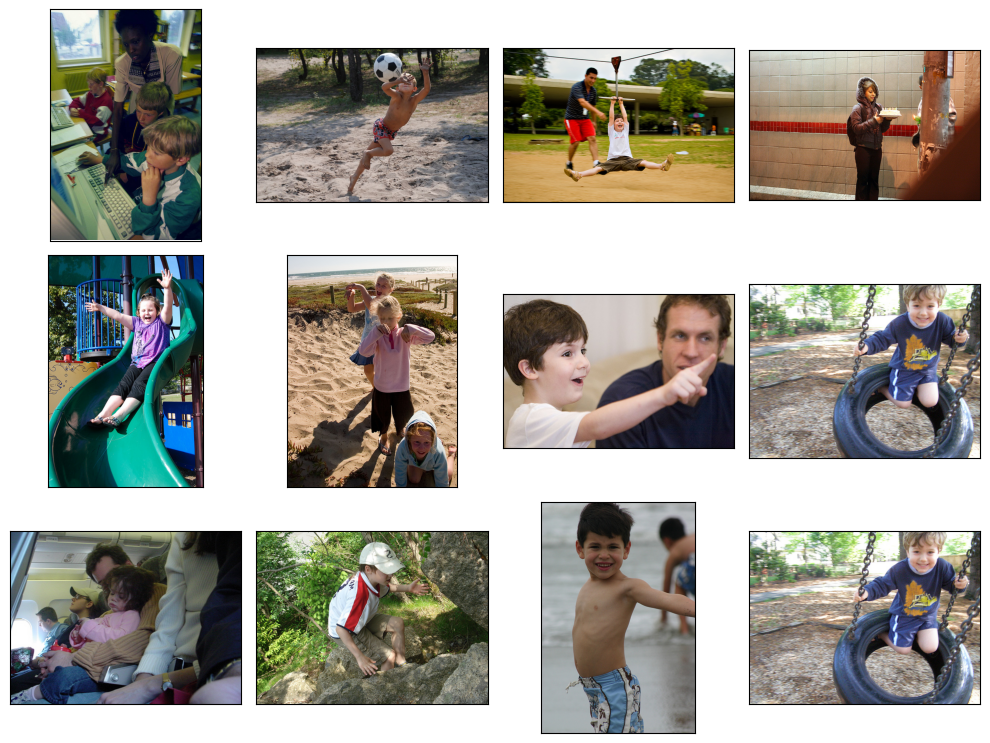

In [42]:
# список изображений попадающих под блок
bl_images = [i[:-2] for i in list(block_texts.query('block_text == 1')['query_id'].unique())] 
# считаем их количество
block_texts = block_texts.query('image in @bl_images').sample(16).reset_index(drop=True)
image_show('/train_images/', block_texts)

In [43]:
# список изображений попадающих под блок
block_images = [i[:-2] for i in list(set(train_df.query('block_text == 1')['query_id']))] 
# считаем их количество
print('Количество изображений попадающих в блок:', len(train_df.query('image in @block_images')))
# удаление изображений попадающих под блок
train_df = train_df.drop(train_df.query('image in @block_images').index)
train_df = train_df.drop('block_text', axis=1).reset_index(drop=True)
train_df.shape


Количество изображений попадающих в блок: 1727


(4040, 4)

**Вывод:** Тексты и фотографии, которые необходимо исключить к целом отобраны корректно и удалены из данных для обучения.

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [44]:
def create_image():
    '''Функция обработки изображения'''
    norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    preprocessor = transforms.Compose([transforms.Resize(256),
                                       transforms.CenterCrop(224),
                                       transforms.ToTensor(),
                                       norm])
    return preprocessor

In [45]:
def create_model():
    '''Функция создания модели'''
    resnet = models.resnet50(pretrained=True)
    # for param in resnet.parameters():
    #     param.requires_grad_(False)
    modules = list(resnet.children())[:-1]
    model = nn.Sequential(*modules)
    model.eval() 
    return model

In [46]:
def vectorize_pictures(model, preprocessor, path, path_df, df):
    '''Функция загрузки изображений и обучения модели'''
    image_embeddings = []
    for i in tqdm(range(len(list(df['image'])))):
        image = Image.open(path + path_df + df['image'][i]).convert('RGB')
        image_tensor = preprocessor(image)
        output_tensor = model(image_tensor.unsqueeze(0)).flatten()
        image_embeddings.append(output_tensor.detach().numpy())
    return np.asarray(image_embeddings)

In [47]:
# векторизация изображений
features_image = vectorize_pictures(create_model(), create_image(), path, 'train_images/', train_df)
# размер признаков
print('Размерность признаков изображений:', features_image.shape)

c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 4040/4040 [06:54<00:00,  9.75it/s]

Размерность признаков изображений: (4040, 2048)


**Вывод:** выполнили векторизацию изображений.

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


In [48]:
# создаём объекты классов DistilBERT + DistilBERTTokenizer
model_class, tokenizer_class = transformers.BertModel, transformers.BertTokenizer
# загружаем веса
tokenizer = tokenizer_class.from_pretrained('bert-base-uncased')
model = model_class.from_pretrained('bert-base-uncased')

In [49]:
def vectorize_text_train(model, text, tokenizer=tokenizer, batch_size=4): 
    '''Функция векторизации текста'''
    # токенизация
    tokenized = text.apply((lambda x: tokenizer.encode(x, add_special_tokens=True, truncation=True, max_length=128)))
    # находим максимальную длину векторов после токенизации
    max_len = max([len(i) for i in tokenized.values])
    # применим padding к векторам
    padded = np.array([i + [0] * (max_len - len(i)) for i in tokenized.values])
    # создадим маску для важных токенов
    attention_mask = np.where(padded != 0, 1, 0)
    # векторизируем текст
    embeddings = []
    for i in tqdm(range(padded.shape[0] // batch_size)):
        batch = torch.LongTensor(padded[batch_size*i:batch_size*(i+1)])
        attention_mask_batch = torch.LongTensor(attention_mask[batch_size*i:batch_size*(i+1)])
        with torch.no_grad():
            batch_embeddings = model(batch, attention_mask=attention_mask_batch)
        embeddings.append(batch_embeddings[0][:,0,:].numpy())
    return np.concatenate(embeddings)  

In [50]:
# векторизация текстов
features_text = vectorize_text_train(model, train_df['lemm_text'])
# итоговый размер признаков
print('Размерность текстовых признаков:', features_text.shape)

100%|██████████| 1010/1010 [02:24<00:00,  6.99it/s]

Размерность текстовых признаков: (4040, 768)


**Вывод**: выполнили векторизацию текстов.

## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [51]:
# объединение векторов
X = np.concatenate((features_image, features_text), axis=1)
display(X.shape)
# целевая переменная
y = np.array(train_df['agr'])

(4040, 2816)

**Вывод:** вектора объединены, целевая переменная выделена.

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]
```
Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

В качестве метрики выберем *RSME*. Так как она чувствительна к выбросам и достаточно легко интерпретируема.

In [52]:
RANDOM_STATE = 42
# учет при разбиении
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=RANDOM_STATE)
# метки обучающей и валидационной выборок
train_indices, valid_indices = next(gss.split(X=X, y=y, groups=train_df['image']))
# разбиение признаков на выборки
X_train, X_valid = X[train_indices], X[valid_indices]
# разбиение целевого признака на выборки
y_train, y_valid = y[train_indices], y[valid_indices]

In [53]:
def metric_rsme(y_v, pred):
    '''Функция расчета метрики'''
    return np.sqrt(np.mean((y_v - pred) ** 2))

In [54]:
# масштабирование
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_valid = scaler.transform(X_valid)

In [55]:
# Линейная регрессия
model_lr = LinearRegression().fit(X_train, y_train)
# предсказание на валидационной выборке
pred_lr = model_lr.predict(X_valid)
score_lr = metric_rsme(y_valid, pred_lr)
print(f'Метрика RMSE на валидационной выборке:', score_lr)

Метрика RMSE на валидационной выборке: 0.3757371539896652


In [56]:
# модель DecisionTree
model_dt = DecisionTreeRegressor(random_state=RANDOM_STATE).fit(X_train, y_train)
# предсказание на валидационной выборке
pred_dt = model_dt.predict(X_valid)
score_dt = metric_rsme(y_valid, pred_dt)
print(f'Метрика RMSE на валидационной выборке:', score_dt)

Метрика RMSE на валидационной выборке: 0.37972316821204266


In [57]:
# модель LGBM
model_lgbm = LGBMRegressor(random_state=RANDOM_STATE).fit(X_train, y_train)
# предсказание на валидационной выборке
pred_lgbm = model_lgbm.predict(X_valid)
score_lgbm = metric_rsme(y_valid, pred_lgbm)
print(f'Метрика RMSE на валидационной выборке:', score_lgbm)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.124141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 709077
[LightGBM] [Info] Number of data points in the train set: 2811, number of used features: 2816
[LightGBM] [Info] Start training from score 0.185002
Метрика RMSE на валидационной выборке: 0.26713399921271574


c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


In [58]:
# перевод в тензоры для обучения нейросети
X_train_n = torch.FloatTensor(X_train)
X_valid_n = torch.FloatTensor(X_valid)
y_train_n = torch.FloatTensor(y_train)
y_valid_n = torch.FloatTensor(y_valid)

In [59]:
# задаем количество эпох, нейронов в слоях
num_epochs = 500
dropout = 0.5
n_in_neurons = X_train.shape[1]
n_hidden_neurons_1 = 200
n_hidden_neurons_2 = 100
n_out_neurons = 1 

# загружаем модель
NNet = nn.Sequential(nn.Linear(n_in_neurons, n_hidden_neurons_1),
                    nn.ReLU(), nn.Dropout(p=dropout),
                    nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2),
                    nn.ReLU(), nn.Dropout(p=dropout),
                    nn.Linear(n_hidden_neurons_2, n_out_neurons))

loss = nn.MSELoss() 
optimizer = torch.optim.Adam(NNet.parameters(), lr=1e-3)

valid_loss_list = []
train_loss_list = []

best_rmse = 20000

# обучаем на заданном количестве эпох
for epoch in range(num_epochs):
    train_preds = NNet.forward(X_train_n).flatten()
    train_loss = loss(train_preds, y_train_n)
    train_loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    
    NNet.eval()
    valid_preds = NNet.forward(X_valid_n).flatten()
   
    # рассчитывам rmse_loss и rmse_val
    valid_loss = loss(valid_preds, y_valid_n)
    rmse_valid = torch.sqrt(valid_loss).item()
    rmse_train = torch.sqrt(train_loss).item()
    
    valid_loss_list.append(torch.sqrt(valid_loss).item())
    train_loss_list.append(torch.sqrt(train_loss).item())
    
    # лучшие значения метрик 
    if rmse_valid < best_rmse:
        best_rmse = rmse_valid
        best_epoch = epoch
        loss_train = rmse_train
        best_preds = valid_preds        
print(f'Epoch {best_epoch}, RMSE train {loss_train}, RMSE valid {best_rmse}')

Epoch 18, RMSE train 0.1246631070971489, RMSE valid 0.2705056071281433


In [60]:
col = ['модель', 'метрика RSME']
model_res = np.array([['LinearRegression', round(score_lr, 4)],
                ['DecisionTree', round(score_dt, 4)],
                ['LGBM', round(score_lgbm, 4)],
                ['Нейронная сеть', round(best_rmse, 4)]])
df_model = pd.DataFrame(model_res, columns=col)
df_model

,модель,метрика RSME
0,LinearRegression,0.3757
1,DecisionTree,0.3797
2,LGBM,0.2671
3,Нейронная сеть,0.2705


**Вывод:** для обучения датасет был разделен на обучающую и валидационную выборки. Были обучены следующие модели МО: линейная регрессия, DecisionTree, LGBM и нейронная сеть. Лучше всего себя показала модель LGBM с значением метрики *RSME* на валидационной выборке 0.2671. Однако, нейронная сеть показала практически такой же результат.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [61]:
# векторизация изображений
features_test_image = vectorize_pictures(create_model(), create_image(), path, 'test_images/', test_images)
# размер признаков
print('Размерность признаков изображений:', features_test_image.shape)

c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 100/100 [00:10<00:00,  9.88it/s]

Размерность признаков изображений: (100, 2048)


In [62]:
def vectorize_text_test(model, text, tokenizer=tokenizer): #return_tensors="pt",
    '''Функция векторизации тестовых текстов''' 
    tokenized = tokenizer(text, return_tensors='pt', add_special_tokens=True, max_length=128, truncation=True)  
    with torch.no_grad():
        outputs = model(**tokenized)
        last_hidden_states = outputs.last_hidden_state
    embedding = last_hidden_states.mean(dim=1)
    return embedding

In [63]:
# лемматизация текстов
test_queries['lemm_text'] = test_queries['clean_query_text'].apply(lemmatize)
test_queries.head()

,query_id,query_text,image,clean_query_text,lemm_text
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg,two blonde boys one in a camouflage shirt and...,two blonde boy one in a camouflage shirt and...
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg,two boys are squirting water guns at each other,two boy be squirt water gun at each other
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg,two boys spraying each other with water,two boy spray each other with water
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg,two children wearing jeans squirt water at eac...,two child wear jean squirt water at each other
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg,two young boys are squirting water at each other,two young boy be squirt water at each other


In [66]:
def result_image(text):
    '''Функция сопоставления изображений с запросом '''
    # проверка попадает ли запрос под законодательстно
    text_list = text.split()
    intersection = set(text_list).intersection(BLOCK_WORDS)
    if intersection:
        print('This image is unavailable in your country in compliance with local laws.')
    else:
        text_embed = vectorize_text_test(model=model, text=[text])
        X = np.concatenate((features_test_image, np.resize(text_embed, (features_test_image.shape[0],768))), axis=1)
        # масштабируем
        X = scaler.transform(X)
        # предсказание
        predictions = model_lgbm.predict(X)

        df_res = pd.concat((test_images, pd.Series(predictions, name='pred')), axis=1) 
        df_res = df_res.sort_values(by='pred', ascending=False)
        top_idx = df_res['pred'].idxmax()
        print(top_idx)
        top_image_name = df_res.loc[top_idx, 'image']
        top_score = df_res.loc[top_idx, 'pred']
        print('\n', text, '\n')
        print(f'Метрика RMSE:', top_score)
        # выведем наиболее похожее изображение
        plt.subplots(figsize=(10, 6))
        image = Image.open(path+'test_images/'+top_image_name)
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()
        plt.show()

This image is unavailable in your country in compliance with local laws.
28

 three woman be dress in costume while one hold an umbrella 

Метрика RMSE: 0.17030005521337188


c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


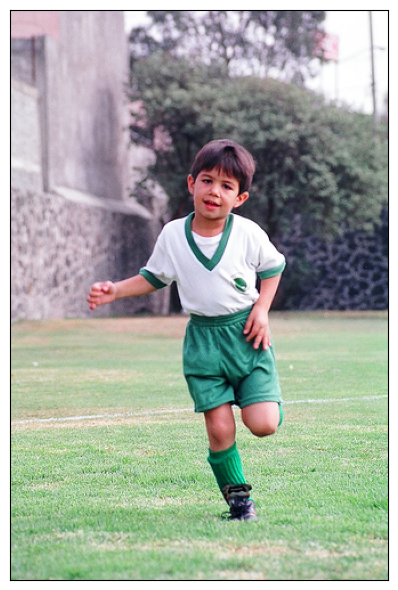

c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


81

 a white dog run on brown grass 

Метрика RMSE: 0.40422964378426607


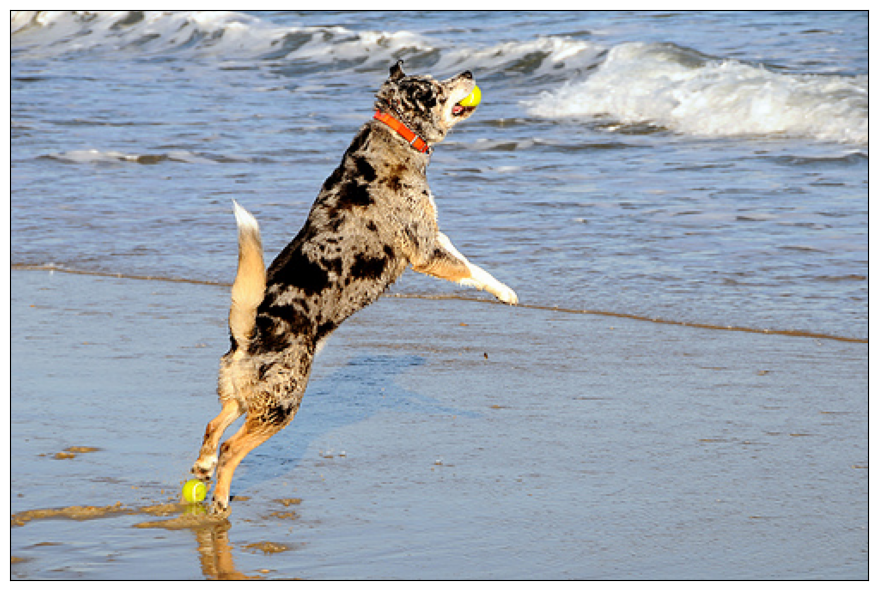

24

 a kickboxer jump for a kick 

Метрика RMSE: 0.40637845224897956


c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


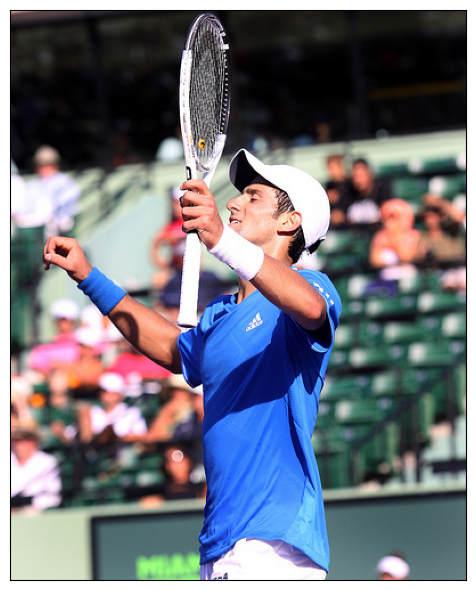

c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


This image is unavailable in your country in compliance with local laws.
28

 three man on mountain bike go over a sand hill 

Метрика RMSE: 0.4073684242005075


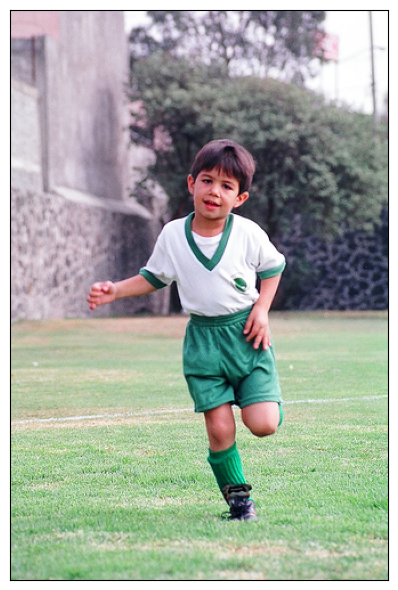

c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


91

 man in a khakicolore tent outside in a rundown area 

Метрика RMSE: 0.3699626846691783


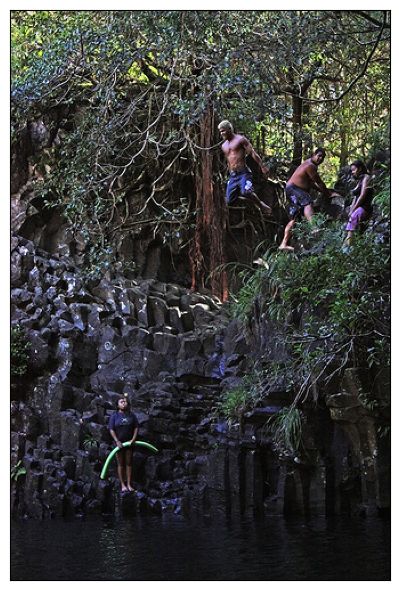

28

 a man with a white hat and plaid shirt behind a woman with a red headdress 

Метрика RMSE: 0.39822989060466896


c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


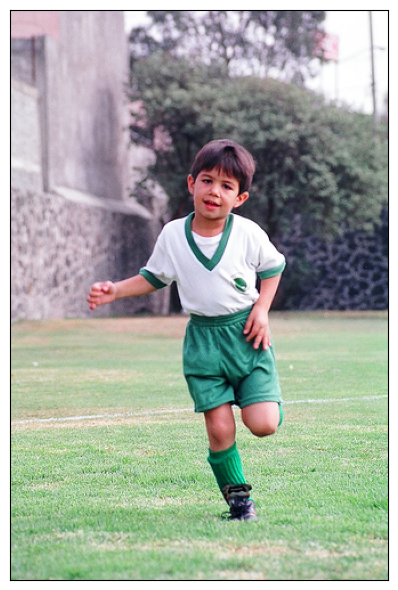

91

 many people stand by watch a car smoke heavily 

Метрика RMSE: 0.30331455444192046


c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


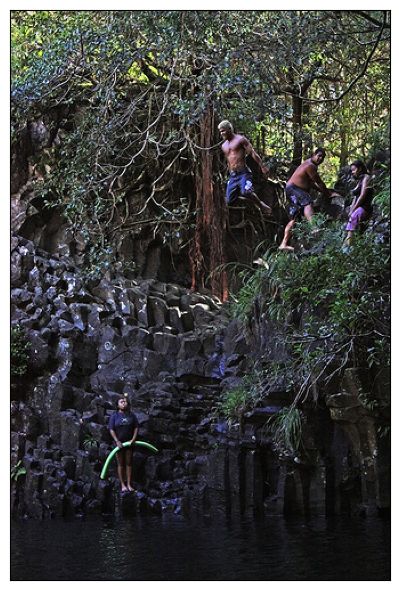

c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


93

 woman in white bikini top and blue short with body of water in the background 

Метрика RMSE: 0.38074468394057853


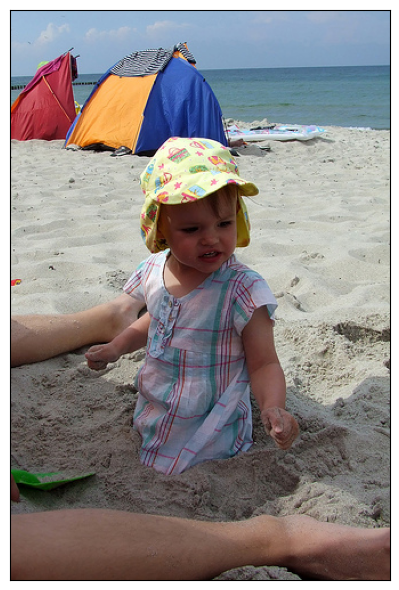

In [69]:
# проверяем работу модели
for text in list(test_queries['lemm_text'].sample(10)):
    result_image(text)

## 8. Выводы

В исследовании для фотохостинга для профессиональных фотографов «Со Смыслом» (“With Sense”) необходимо было разработать модель, которая будет искать референсные фотографии для фотографов, то есть подбирать фотографии под описание.

Данные были загружены корректно. Пропуски и дубликаты в данных отсутствуют. Проведен исследовательский анализ данных: наиболее часто встречаются слова *dog*, *two* и *man*. Следует отметить, что в описаниях встречаются слова *boy*, *girl* и *young*, а в фотографиях встречаются фото детей, что может накладывать законодательные ограничения в использовании таких данных в ряде стран. Также на основе краудсорсинговых и экспертных оценок была получена агрегированая оценка соответствия изображения тексту. Такие изображения были исключены из датасета для обучения. Далее была проведена векторизация изображений с помощью ResNet50 и векторизация текстовых описаний с помощью предобученной нейронной сети Bert. На основе суммарного вектора были обучены несколько моделей МО. В качестве метрики использовали метрику *RSME*, так как она чувствительна к выбросам и достаточно легко интерпретируема. Лучше всего себя показала модель LGBM. Однако, нейронная сеть показала практически такой же результат. Лучшую модель протестировали не тестовой выборке, и вывели изображение максимально подходящее под описание.

**Итоговый вывод:** при достаточно высоком качестве работы модели, не релевантные результаты попадаются. Устранить данный недостаток может дальнейшее улучшение модели, а также борьба с переобучением или расширение обучающей выборки.

- [x]  Jupyter Notebook открыт
- [x]  Весь код выполняется без ошибок
- [x]  Ячейки с кодом расположены в порядке исполнения
- [x]  Исследовательский анализ данных выполнен
- [x]  Проверены экспертные оценки и краудсорсинговые оценки
- [x]  Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- [x]  Изображения векторизованы
- [x]  Текстовые запросы векторизованы
- [x]  Данные корректно разбиты на тренировочную и тестовую выборки
- [x]  Предложена метрика качества работы модели
- [x]  Предложена модель схожести изображений и текстового запроса
- [x]  Модель обучена
- [x]  По итогам обучения модели сделаны выводы
- [x]  Проведено тестирование работы модели
- [x]  По итогам тестирования визуально сравнили качество поиска